# Gaeltacht Airbnb Listings

This notebook shows the process used to find Airbnb listings in the Galway Gaeltacht.

Note: Airbnb blocks web scrapers from searching their site, so we rely on [Inside Airbnb](https://insideairbnb.com/get-the-data)'s data for Ireland. We can run Scrapy on the specific listing URLs but most of the information we would want is already provided in Inside Airbnb's listings.csv (which just needs to be unzipped from listings.csv.gz).

Questions
- We were focusing on listings for entire homes (room_type=="Entire*"), but what about private/shared rooms in guest houses/ etc (property_type=="Private room in guest house") where the owner is letting all the individual rooms in an entire property?
- I haven't been able to find the 81 approved STL planning permissions in Galway County (only 17 in Galway city that I could find)-- can we get the list of permission reference IDs behind the 81 figure?
- Any proposals to get around "Exact location provided after booking"? (I'm wondering if we look at planning permissions for guest houses, etc that we can use to figure out if planning permission was obtained for the development itself but not for the development's use as an STL?)

In [1]:
'''
# only necessary for running in colab
from google.colab import drive
drive.mount('/content/drive/')
cwd = '/content'
input_dir = cwd+"/drive/MyDrive/CATU_STL_reporting/inputs"
output_dir = cwd+"/drive/MyDrive/CATU_STL_reporting/outputs"
images_dir = cwd+"/drive/MyDrive/CATU_STL_reporting/images"
'''

'\n# only necessary for running in colab\nfrom google.colab import drive\ndrive.mount(\'/content/drive/\')\ncwd = \'/content\'\ninput_dir = cwd+"/drive/MyDrive/CATU_STL_reporting/inputs"\noutput_dir = cwd+"/drive/MyDrive/CATU_STL_reporting/outputs"\nimages_dir = cwd+"/drive/MyDrive/CATU_STL_reporting/images"\n'

In [2]:
import os
import pandas as pd
from PIL import Image
import geopandas as gp
from shapely.geometry import Point
cwd = os.getcwd()
input_dir = cwd+"/inputs"
output_dir = cwd+"/outputs"
images_dir = cwd+"/images"

## 1. Getting Data

### Airbnb
We can download and unzip listings.csv.gz from [Inside Airbnb](https://insideairbnb.com/get-the-data), which includes over 80 fields of information. We won't be interested in all of the fields right now, but there is a lot to explore.

In [3]:
# we load the data into a pandas data frame, and print the list of columns
list_df = pd.read_csv(input_dir+'/listings.csv')
list_df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_searched', 'last_scraped',
       'source', 'name', 'description', 'neighborhood_overview', 'picture_url',
       'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'latitude', 'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability',
       'ava

This data is for all of Ireland, so we need to narrow it down. We could try to find the region_ids for Gaeltacts and filter that way, but for now, we'll just look for Connemara, Galway listings.

In [4]:
galway_county_df = list_df[list_df['region_parent_name'].str.contains("Galway")]#3123 listings
set(list(galway_county_df['region_name']))

{'Athenry-Oranmore LEA-7',
 'Ballinasloe LEA-6',
 'Conamara North LEA-4',
 'Conamara South LEA-5',
 'Galway City Central LEA-6',
 'Galway City East LEA-6',
 'Galway City West LEA-6',
 'Gort-Kinvara LEA-5',
 'Loughrea LEA-5',
 'Tuam LEA-7'}

So we'll go ahead and filter for listings in either of the "Conamara" regions.

In [5]:
conamara_df = galway_county_df[galway_county_df['region_name'].str.contains("Conamara")] #1228 listings
# if you want to check the length of the df yourself, uncomment the line below
#len(conamara_df)
# if you want to preview the df, uncomment the line below
#conamara_df

Now we'll check what kind of listings these are and filter the ones relevant to us ('Entire home/apt' for now)

In [6]:
set(list(conamara_df["room_type"]))

{'Entire home/apt', 'Hotel room', 'Private room', 'Shared room'}

In [7]:
# Filter by room_type='Entire home/apt'
con_entire = conamara_df[conamara_df["room_type"].str.contains("Entire")] #940 listings

Now maybe we want to get rid of some of the columns we aren't interested in this time around, just to make things look a bit cleaner for us.

In [8]:
desired_columns = ['id', 'listing_url', 'scrape_id', 'last_searched', 'last_scraped',
       'source', 'name', 'description', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_neighbourhood', 'host_listings_count','host_total_listings_count', 'neighbourhood',
       'latitude', 'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'price', 'estimated_occupancy_l365d',
       'estimated_revenue_l365d','calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'region_id',
       'region_name', 'region_parent_id', 'region_parent_name',
       'region_parent_parent_id', 'region_parent_parent_name'
       ]
con_final = con_entire.filter(desired_columns, axis=1)

Now we have our final Galway Connemara Airbnb dataset. We can save it as a csv or excel file now, but in the next section we will work on making a map of this data.

In [9]:
#con_final.to_csv(output_dir+"/connemara_270925.csv")
con_final.to_excel(output_dir+'/connemara_270925.xlsx')

## 2. Geospatial Data
So, in order to automatically evaluate if a listing is in the gaeltacht, we're going to do some geospatial calculations. First, we're going to download the geopackage of the [Gaeltacht Areas - National Administrative Boundaries - Ungeneralised - 2024](https://data.gov.ie/dataset/gaeltacht-areas-national-administrative-boundaries-ungeneralised-20241) map from Tailte Éireann and put it in our "inputs" folder. Then, we're going to convert our tables of listings into what's called a point shapefile. Then, we're going to see where the two overlap.

It may also be helpful to view the files on free GIS software like QGIS.

### Listing Table to Shapefile

In [10]:
con_gdf = gp.GeoDataFrame(
    con_final, geometry=gp.points_from_xy(con_final.longitude, con_final.latitude, crs="EPSG:4326")
)

Maybe we update the column names ourselves too (field names can't be more than 10 characters and get automatically truncated)

In [11]:
mapper = {
    'listing_url':'list_url',
    'last_searched':"srch_date",
    'last_scraped':"scrpe_date",
    'description':"descrpt",
    'host_location':"host_loc",
    'host_neighbourhood':"host_nbhd",
    'host_listings_count':"hst_lcount",
    'host_total_listings_count':"hst_t_lcnt",
    'neighbourhood':"nbhd",
    'property_type':"prop_type",
    'accommodates':"max_guests",
    'estimated_occupancy_l365d':"est_occ_yr",
    'estimated_revenue_l365d': "est_rev_yr",
    'calculated_host_listings_count':"htlc",
    'calculated_host_listings_count_entire_homes':"htlc_eh",
    'calculated_host_listings_count_private_rooms':"htlc_pr",
    'calculated_host_listings_count_shared_rooms':"htlc_sr",
    'region_name':"reg_name",
    'region_parent_id':"reg_pid",
    'region_parent_name':"reg_pname",
    'region_parent_parent_id':"reg_ppid",
    'region_parent_parent_name':"reg_ppname"
}
con_gdf.rename(mapper, axis=1, inplace=True)

Now we can save the file if we want to view it in QGIS or load it back in later.

In [13]:
# you may need to create the folder "shapefiles" in the folder "outputs"
con_gdf.to_file(output_dir+"/shapefiles/connemara_listings.shp")

C:\Users\allie\AppData\Roaming\Python\Python311\site-packages\pyogrio\raw.py:723: RuntimeWarning: Value 'The perfect base to tour Connemara, Galway City, the Aran Islands, fish Lough Corrib, walk, cycle or relax.  At the gateway to Connemara, a 30 minute drive to Galway City & a 2 minute walk to Lough Corrib famous for trout & salmon fishing this quaint & cosy 1 bed apartment is ideal for a couple or solo traveler. 6km to Oughterard village which has an abundance of award winning restaurants, pubs & live music. Nearby attractions are Bridget's Garden, Corrib Cruise, Wildlands Adventure & lot more.' of field descrpt has been truncated to 254 characters.  This warning will not be emitted any more for that layer.
  ogr_write(


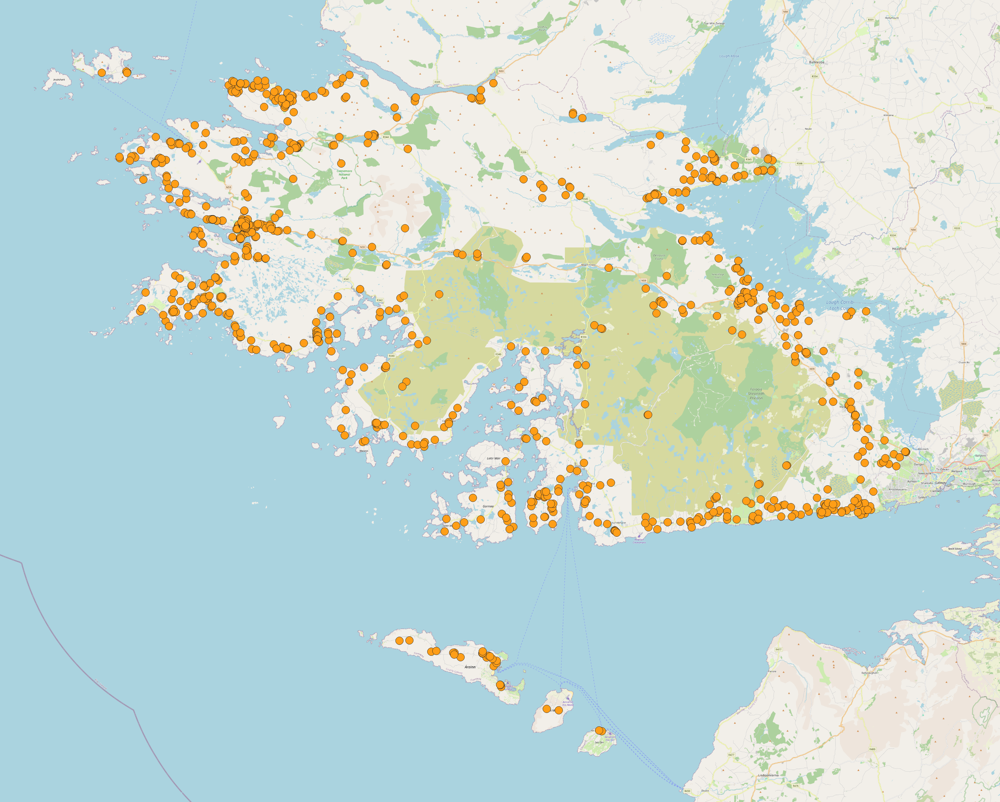

In [14]:
# if we were to load the data in QGIS it would look like this
Image.open(images_dir+'/connemara_entire_listings.png')

### Gaeltacht Boundaries

In [15]:
gael_gdf = gp.read_file(input_dir+"/Gaeltacht_Areas___National_Administrative_Boundaries___Ungeneralised_2024_8985892886218565969.gpkg")
# reproject to same coordinate system as airbnb data
gael_gdf = gael_gdf.to_crs("EPSG:4326")

C:\Users\allie\AppData\Roaming\Python\Python311\site-packages\pyogrio\raw.py:198: RuntimeWarning: Non-conformant content for record 1 in column POLY_GEOM_CAPTURE_DATE, 2017-08-01T00:00:00.0Z, successfully parsed
  return ogr_read(


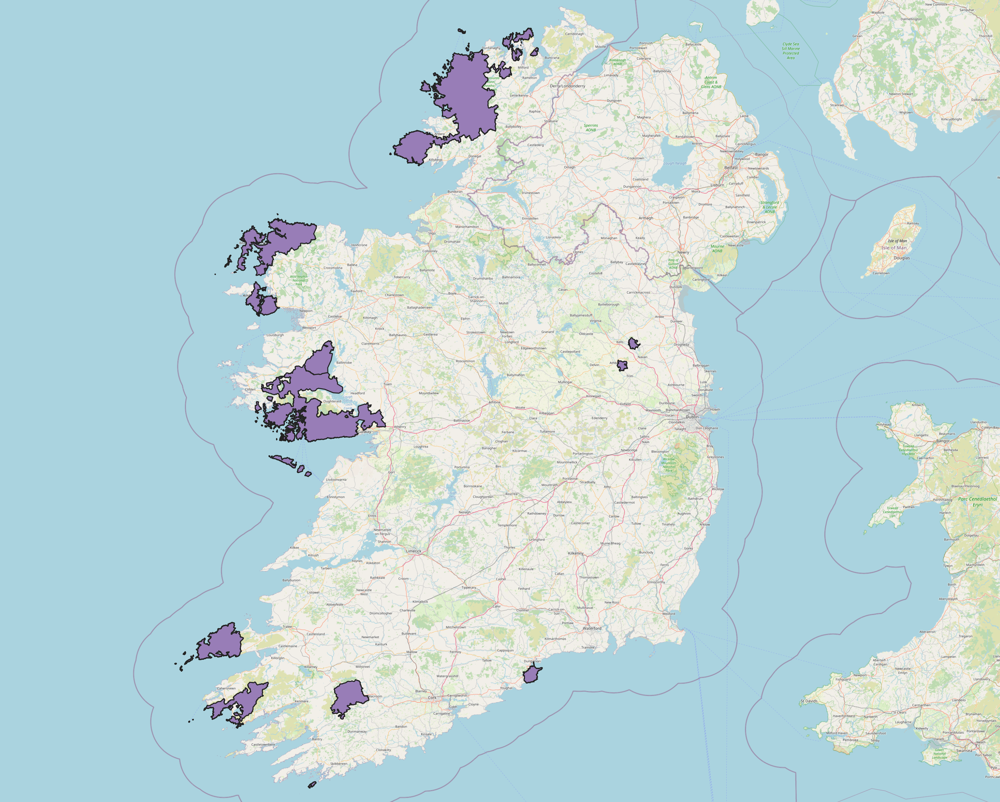

In [16]:
# if we were to load the data in QGIS it would look like this
Image.open(images_dir+'/gaeltachts.png')

### GIS Magic

Now that we have both the Connemara listings and the Gaeltacht boundaries, we can filter for only the listings contained within the the Gaeltacht boundaries.

In [17]:
def in_gaeltct(row):
    point = Point(row['longitude'], row['latitude'])
    return gael_gdf.contains(point).any()

con_gdf['gaeltacht'] = con_gdf.apply(in_gaeltct, axis=1)

In [18]:
ggael_gdf = con_gdf[con_gdf['gaeltacht']==True] #391 listings

Now we can save that as a shapefile and as an excel sheet.

In [19]:
ggael_gdf.rename(mapper, axis=1, inplace=True)
ggael_gdf.to_file(output_dir+"/shapefiles/galway_gaeltacht_listings.shp")
#
ggael_df = pd.DataFrame(ggael_gdf.drop(columns='geometry'))
ggael_df.to_excel(output_dir+'/galway_gaeltacht_listings_270925.xlsx')

C:\Users\allie\AppData\Local\Temp\ipykernel_14012\2466810565.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ggael_gdf.rename(mapper, axis=1, inplace=True)
C:\Users\allie\AppData\Roaming\Python\Python311\site-packages\pyogrio\raw.py:723: RuntimeWarning: Value 'Ben Levy Suite, Clonbur, Self Catering Rental:<br /><br />Accommodation:<br /><br />Charming Twin Bedroom Living Suite with separate Kitchen and Full Bathroom.  Patio Doors, Terrace. Accommodation::<br />Two Single Beds,  bed linen, duvets, pillows. Coffee Table, Antique Desk/ Dresser with Ornate Chairs. Coat Stand, Leather Sofa.<br />Kitchen: Electric Hob, Sink, cafetiere coffee maker, mini-oven, Cabinet with cooking utensils, delph, cutlery, dining table, chairs. Bathroom with Bath and shower, Towels. Shared Entrance Hall.' of field descrpt

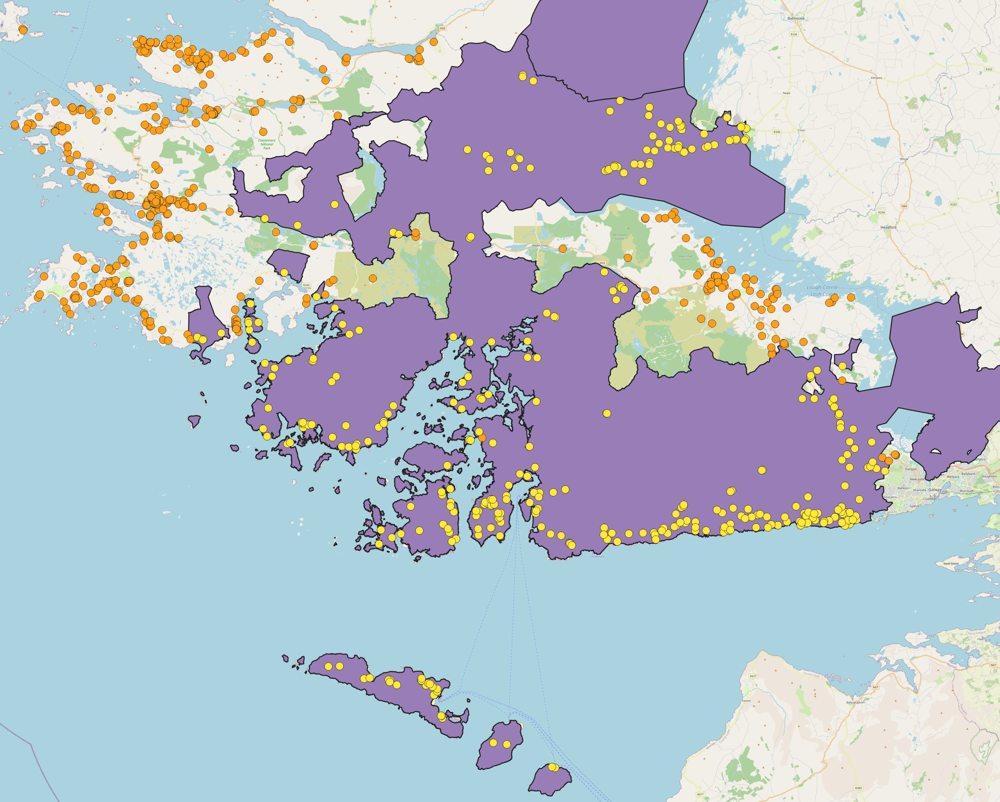

In [20]:
# if we were doing this in QGIS it would look like this
Image.open(images_dir+'/listings_of_gaeltacht.png')